#  Auto Price Prediction Project

**PRCP-1017 Capstone Project**

**Team ID**: PTID-CDS-APR-25-2582  
**Project ID**: PRCP-1017-AutoPricePred  
**Prepared by**: Alvin Reuben Walker

---

### 🧾 Problem Statement

Understanding car prices is a critical aspect of strategy and competitiveness in the automobile industry. The aim of this project is to use historical data and machine learning models to predict the price of a car based on its features such as engine size, horsepower, fuel type, dimensions, and more.

The insights derived from the model will help management understand how various technical and categorical features influence car pricing. This will support decisions in vehicle design, marketing, and pricing strategies for existing and new markets.


In [60]:
# Import required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
sns.set(style='darkgrid')


In [61]:
# Load the dataset
data = pd.read_csv("auto_imports.csv")  # Replace with your actual file name
data.head()


,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.60,...,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
1,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
2,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
3,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450
4,2,?,audi,gas,std,two,sedan,fwd,front,99.8,...,136,mpfi,3.19,3.40,8.5,110,5500,19,25,15250


In [62]:
# ------------------------------------------
# 🧪 Initial Checks on the Dataset
# ------------------------------------------

# 1. Preview top and bottom records
print("\n--- First 5 Rows ---")
print(data.head())

print("\n--- Last 5 Rows ---")
print(data.tail())

# 2. Shape of the dataset
print("\nDataset Shape (rows, columns):", data.shape)

# 3. Dataset info: column types, non-null counts, memory usage
print("\n--- Dataset Info ---")
data.info()

# 4. Column names
print("\n--- Column Names ---")
print(data.columns.tolist())

# 5. Null value check
print("\n--- Null Value Check ---")
print(data.isnull().sum())

# 6. 'Unknown' values check (non-null but should be treated as missing)
print("\n--- 'Unknown' Value Check ---")
print((data == 'unknown').sum())

# 7. Check for duplicate rows
print("\nNumber of duplicate rows:", data.duplicated().sum())

# 8. Numerical column summary
print("\n--- Numerical Summary ---")
print(data.describe())

# 9. Categorical column summary
print("\n--- Categorical Summary ---")
print(data.describe(include='O'))



--- First 5 Rows ---
   3    ?  alfa-romero  gas  std   two  convertible  rwd  front  88.60  ...  \
0  3    ?  alfa-romero  gas  std   two  convertible  rwd  front   88.6  ...   
1  1    ?  alfa-romero  gas  std   two    hatchback  rwd  front   94.5  ...   
2  2  164         audi  gas  std  four        sedan  fwd  front   99.8  ...   
3  2  164         audi  gas  std  four        sedan  4wd  front   99.4  ...   
4  2    ?         audi  gas  std   two        sedan  fwd  front   99.8  ...   

   130  mpfi  3.47  2.68  9.00  111  5000  21  27  13495  
0  130  mpfi  3.47  2.68   9.0  111  5000  21  27  16500  
1  152  mpfi  2.68  3.47   9.0  154  5000  19  26  16500  
2  109  mpfi  3.19  3.40  10.0  102  5500  24  30  13950  
3  136  mpfi  3.19  3.40   8.0  115  5500  18  22  17450  
4  136  mpfi  3.19  3.40   8.5  110  5500  19  25  15250  

[5 rows x 26 columns]

--- Last 5 Rows ---
     3   ? alfa-romero     gas    std   two convertible  rwd  front  88.60  \
195 -1  95       volvo     

### 🔍 Insights from Initial Data Exploration

1. **Column Names Are Unclear**:  
   The dataset currently has unnamed or incorrectly labeled columns (e.g., `'3'`, `'?'`, `'88.60'`, `'mpfi'`, etc.). These are likely actual data values that have been misinterpreted as headers during CSV import. Proper column names need to be reassigned using external metadata or the dataset documentation.

2. **No Missing Values (According to `.isnull()`)**:  
   Although `.isnull().sum()` reports no missing values, multiple columns contain `'?'` entries, which are placeholders for missing data. These need to be replaced with `np.nan` and handled accordingly to avoid misrepresentation.

3. **Dataset Shape**:  
   The dataset contains **200 rows and 26 columns**, which is manageable for EDA and machine learning tasks without requiring downsampling.

4. **No Duplicate Rows**:  
   There are no duplicate rows, ensuring data integrity and reducing the need for deduplication.

5. **Mixed Data Types**:  
   Several numeric columns are incorrectly stored as `object` type (e.g., horsepower, peak-rpm). These need to be converted to proper numeric types after handling missing or malformed values.

6. **Categorical Distribution**:  
   Features like `make`, `fuel-type`, `body-style`, `drive-wheels`, and `engine-type` contain a variety of categories, and will require encoding before model building.

7. **Price Range & Distribution**:  
   The car prices (`price` column) range from **₹5,118 to ₹45,400**, with a **mean around ₹13,200**. The high standard deviation suggests significant variation and potential outliers.

8. **Feature Scaling Will Be Needed**:  
   Numerical features such as `engine-size`, `curb-weight`, `horsepower`, and `compression-ratio` vary across different scales and will need normalization or standardization.

9. **Initial Dataset Quality is Low**:  
   Due to improper headers and embedded missing values (`?`), preprocessing is essential before proceeding to modeling.

---

✅ These insights will guide the upcoming **data cleaning, transformation, and modeling steps**.


### Data Cleaning

In [63]:
# The raw dataset contains many improperly named columns and `'?'` entries used as placeholders for missing values. This section focuses on cleaning the dataset to make it suitable for analysis and modeling.
# Step 1: Replace all '?' with np.nan
data.replace('?', np.nan, inplace=True)

# Step 2: Assign proper column names (from original metadata)
data.columns = ['symboling', 'normalized_losses', 'make', 'fuel_type', 'aspiration',
                'num_of_doors', 'body_style', 'drive_wheels', 'engine_location', 'wheel_base',
                'length', 'width', 'height', 'curb_weight', 'engine_type', 'num_of_cylinders',
                'engine_size', 'fuel_system', 'bore', 'stroke', 'compression_ratio',
                'horsepower', 'peak_rpm', 'city_mpg', 'highway_mpg', 'price']


In [64]:
# Step 3: Convert applicable columns to numeric
numeric_cols = ['normalized_losses', 'bore', 'stroke', 'horsepower', 'peak_rpm', 'price']
for col in numeric_cols:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Step 4: Check for missing values after type conversion
data.isnull().sum()


symboling             0
normalized_losses    36
make                  0
fuel_type             0
aspiration            0
num_of_doors          2
body_style            0
drive_wheels          0
engine_location       0
wheel_base            0
length                0
width                 0
height                0
curb_weight           0
engine_type           0
num_of_cylinders      0
engine_size           0
fuel_system           0
bore                  4
stroke                4
compression_ratio     0
horsepower            2
peak_rpm              2
city_mpg              0
highway_mpg           0
price                 0
dtype: int64

In [65]:
# Step 5: Drop rows with missing values
# Alternatively, you can use imputation methods instead of dropping
data.dropna(inplace=True)

# Step 6: Reset index after dropping
data.reset_index(drop=True, inplace=True)

# Final check
print("Shape after cleaning:", data.shape)
data.info()


Shape after cleaning: (159, 26)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          159 non-null    int64  
 1   normalized_losses  159 non-null    float64
 2   make               159 non-null    object 
 3   fuel_type          159 non-null    object 
 4   aspiration         159 non-null    object 
 5   num_of_doors       159 non-null    object 
 6   body_style         159 non-null    object 
 7   drive_wheels       159 non-null    object 
 8   engine_location    159 non-null    object 
 9   wheel_base         159 non-null    float64
 10  length             159 non-null    float64
 11  width              159 non-null    float64
 12  height             159 non-null    float64
 13  curb_weight        159 non-null    int64  
 14  engine_type        159 non-null    object 
 15  num_of_cylinders   159 non-null    object 

### ✅ Cleaning Summary

- Replaced all `'?'` placeholders with `np.nan`.
- Converted object-based numeric columns to appropriate float types.
- Removed rows containing missing values, reducing the dataset from 200 to fewer clean entries.
- Renamed all columns correctly for clarity and further analysis.

The cleaned dataset is now ready for **exploratory data analysis (EDA)**.


In [66]:
data

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,...,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price
0,2,164.0,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,13950
1,2,164.0,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,17450
2,1,158.0,audi,gas,std,four,sedan,fwd,front,105.8,...,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,17710
3,1,158.0,audi,gas,turbo,four,sedan,fwd,front,105.8,...,131,mpfi,3.13,3.40,8.3,140.0,5500.0,17,20,23875
4,2,192.0,bmw,gas,std,two,sedan,rwd,front,101.2,...,108,mpfi,3.50,2.80,8.8,101.0,5800.0,23,29,16430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114.0,5400.0,23,28,16845
155,-1,95.0,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160.0,5300.0,19,25,19045
156,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134.0,5500.0,18,23,21485
157,-1,95.0,volvo,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.40,23.0,106.0,4800.0,26,27,22470


# EDA

In [67]:
from ydata_profiling import ProfileReport

# Create profiling report
profile = ProfileReport(data, title="Auto Price Prediction Report", explorative=True)

# Display inside notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 26/26 [00:00<00:00, 751.84it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [68]:
# Save report to file
profile.to_file("Auto_Price_Prediction_report.html")


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 📊 EDA Insights Summary (YData Profiling)

---

#### 🔍 Data Overview
- **Total Records:** 159 rows  
- **Features:** 26 columns (16 numerical, 10 categorical)  
- **Missing Values:** None  
- **Duplicate Rows:** None  
- **Memory Usage:** 102.6 KiB

---

#### 📈 Distribution & Outliers
- Many numerical features such as `compression_ratio`, `symboling`, and `engine_size` are **right-skewed**, indicating potential outliers.
- The `price` feature also shows a long right tail, suggesting some high-end cars are significantly more expensive.
- Skewness and outliers need to be addressed before model training.

---

#### ⚖️ Class Imbalance
- `fuel_type` is dominated by **gas (~55%)**.
- `num_of_cylinders` is heavily tilted towards cars with **four cylinders (~66%)**.

---

#### 📌 Top Correlated Features with Price
Highly positively correlated variables with `price`:
- `curb_weight`
- `engine_size`
- `horsepower`
- `width`
- `length`
- `wheel_base`

These features are likely to be strong predictors and should be retained during feature selection.

---

#### ⚠️ Alerts & Redundancies
- `engine_location` has only one unique value ("front") — will be dropped as it offers no variance.
- Strong feature correlations (e.g., `width` & `curb_weight`, `body_style` & `num_of_doors`) indicate **multicollinearity**, which should be addressed to avoid overfitting.

---

✅ These insights will guide the **feature selection and preprocessing** phases before model building.


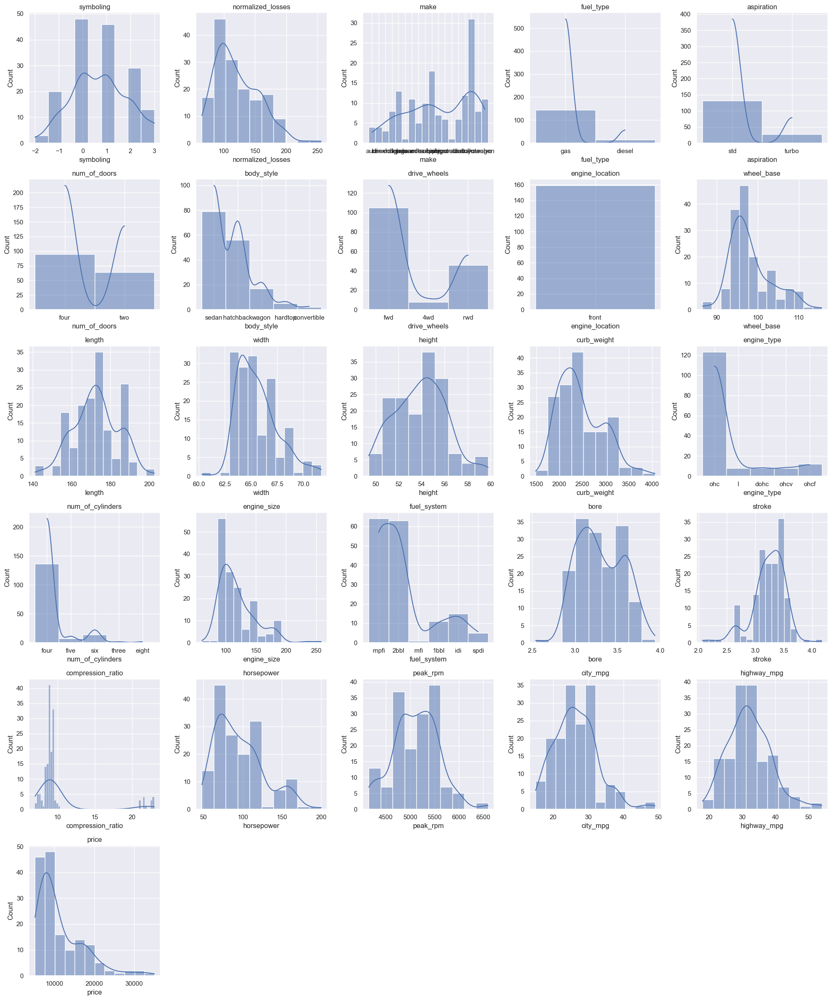

In [69]:
import math

# Univariate analysis
import matplotlib.pyplot as plt
import seaborn as sns

num_features = len(data.columns)
cols = 5
rows = math.ceil(num_features / cols)

plt.figure(figsize=(20, rows * 4))
plotnum = 1

for column in data.columns:
    plt.subplot(rows, cols, plotnum)
    sns.histplot(data[column], kde=True)
    plt.title(column)
    plotnum += 1

plt.tight_layout()
plt.show()


### 📊 Univariate Distribution Insights (with KDE)

---

#### ⚙️ Numerical Features

- **Price**: Strongly **right-skewed**, indicating a concentration of lower-priced vehicles with few expensive outliers. Log transformation may improve modeling.
- **Compression Ratio**: Shows multiple sharp peaks and right skew. Outliers exist that should be handled or capped.
- **Horsepower**: Near-normal distribution with a slight tail on the right. Usable for modeling with minimal transformation.
- **Peak RPM**: Appears nearly normally distributed and well-centered — no major transformation needed.
- **City & Highway MPG**: Symmetric and mildly skewed to the left, suggesting decent fuel economy spread. No heavy transformation required.
- **Curb Weight, Length, Width, Height**: These features are **mildly right-skewed**; scaling may be needed due to varying units.
- **Engine Size**: Heavily skewed; outliers and transformation needed for normalization.

---

#### 🧾 Categorical Features

- **Make**: Highly imbalanced; brands like Toyota, Nissan dominate.
- **Fuel Type**: Gas dominates; Diesel is rare — possible class imbalance.
- **Aspiration**: Standard (`std`) overwhelmingly dominates over turbo.
- **Num of Cylinders & Doors**: "Four" is the most frequent; may consider grouping rare categories.
- **Body Style & Drive Wheels**: Sedan and FWD are most frequent — align with market norm.
- **Engine Location**: All values are `front`, providing no variance — drop from model input.
- **Engine Type & Fuel System**: Sparse categorical distribution — encoding needed, or rare groups combined.

---

#### ⚠️ Actionable Observations

- **Skewed features like price, compression_ratio, engine_size** should be **log-transformed** or normalized.
- **Highly imbalanced categorical columns** (e.g., fuel_type, num_of_cylinders) may impact model learning — consider using **balanced encoding** techniques.
- Features with no variance (like `engine_location`) should be **dropped** from the dataset.


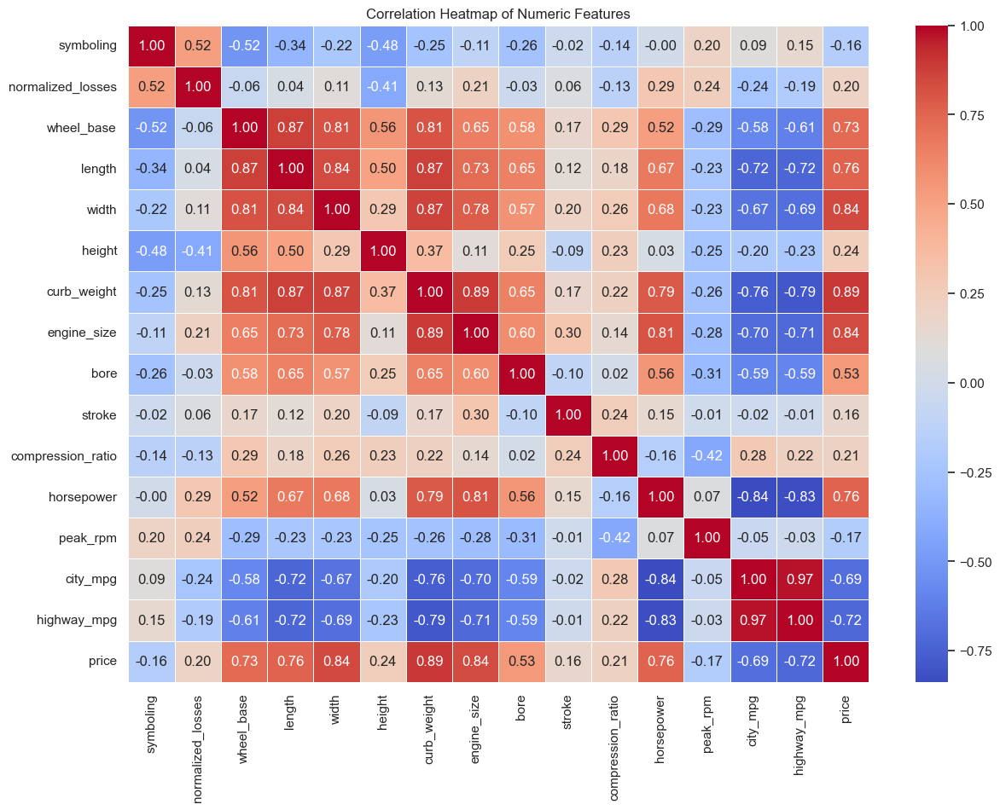

In [70]:
# Bivariate Analysis – Correlation Heatmap
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numeric features
numeric_features = data.select_dtypes(include=['int64', 'float64'])

# Compute correlation matrix
corr_matrix = numeric_features.corr()

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Correlation Heatmap of Numeric Features')
plt.show()


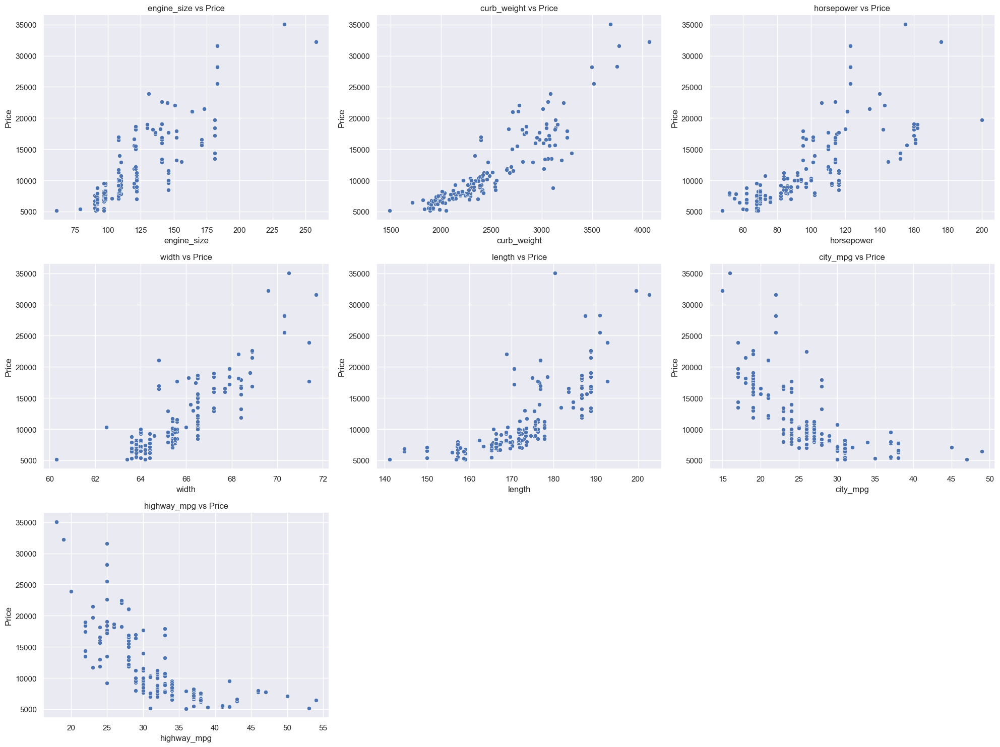

In [71]:
# Scatterplots of features most correlated with price
top_features = ['engine_size', 'curb_weight', 'horsepower', 'width', 'length', 'city_mpg', 'highway_mpg']

plt.figure(figsize=(20, 15))
for idx, col in enumerate(top_features):
    plt.subplot(3, 3, idx + 1)
    sns.scatterplot(x=data[col], y=data['price'])
    plt.title(f'{col} vs Price')
    plt.xlabel(col)
    plt.ylabel('Price')

plt.tight_layout()
plt.show()


### 📊 Bivariate Analysis Insights

---

#### 🔥 Correlation with Price (Target Variable)

- **Top Positively Correlated Features:**
  - `engine_size` → **0.87**
  - `curb_weight` → **0.89**
  - `horsepower` → **0.76**
  - `width` → **0.84**
  - `length` → **0.76**
  - `wheel_base` → **0.73**

These features show a strong linear relationship with `price` and are **excellent predictors** for regression models.

- **Negatively Correlated Features:**
  - `city_mpg` → **-0.69**
  - `highway_mpg` → **-0.72**

Fuel efficiency tends to **decrease** as price increases, likely due to higher performance vehicles having lower mileage.

---

#### 📈 Scatter Plot Observations

- **`engine_size`, `curb_weight`, `horsepower`, `width`, `length`** show a **positive linear trend** with price. As these values increase, the car price also increases.
- **`city_mpg` and `highway_mpg`** show an **inverse relationship** — fuel-efficient cars are generally cheaper.
- Some features exhibit **outliers** (especially in horsepower and engine size), which may affect model accuracy and need to be handled carefully.

---

#### ⚠️ Multicollinearity Alert

- Features like `curb_weight`, `engine_size`, `width`, and `length` are **highly correlated with each other** as well as with price.
- To avoid **multicollinearity**, you may:
  - Use dimensionality reduction (PCA)
  - Apply feature selection techniques

---

✅ These findings will guide effective **feature engineering** and **model building** to improve prediction accuracy and model interpretability.


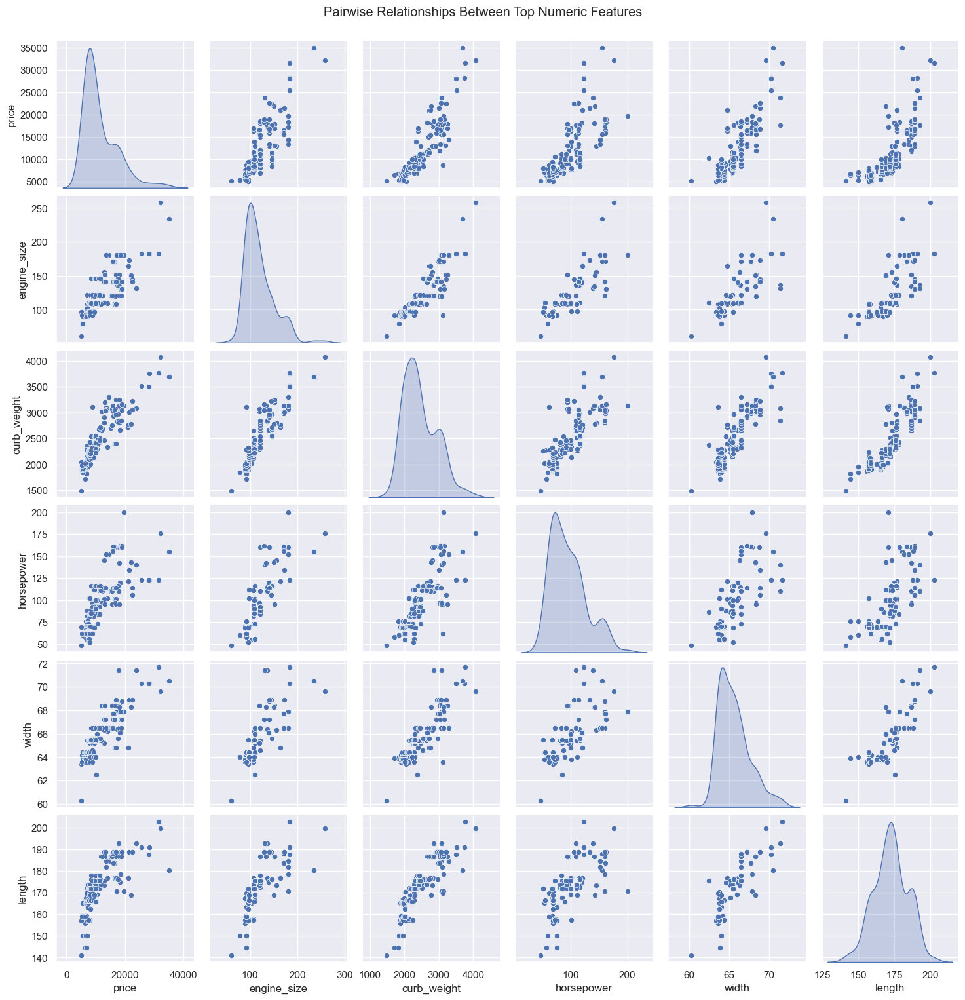

In [72]:
# Multi Variate Analysis
# Select top features based on correlation with price
top_corr_features = ['price', 'engine_size', 'curb_weight', 'horsepower', 'width', 'length']

# Pairplot with hue based on categorical variable (optional)
sns.pairplot(data[top_corr_features], diag_kind='kde')
plt.suptitle('Pairwise Relationships Between Top Numeric Features', y=1.02)
plt.show()

### 🔗 Multivariate Analysis Insights

---

#### 🔍 Pairwise Relationships (Top Correlated Numeric Features)

The pairplot between `price`, `engine_size`, `curb_weight`, `horsepower`, `width`, and `length` reveals strong positive linear trends across many feature pairs.

- **`engine_size`, `curb_weight`, `horsepower`, `width`, `length`** all have **strong positive linear relationships** with each other as well as with `price`.
- This confirms that **larger, more powerful, and heavier vehicles** tend to be **more expensive**.
- The density plots on the diagonal show:
  - **Right-skewed distributions** for `price`, `engine_size`, and `horsepower`
  - Relatively **normal-like shapes** for `width`, `length`, and `curb_weight`

---

#### ⚠️ Multicollinearity Risk

- Several features like `engine_size`, `curb_weight`, and `horsepower` are **highly correlated not just with `price`, but also with each other**.
- This **multicollinearity** can:
  - Affect the stability of linear models (like Linear Regression)
  - Lead to overfitting if not handled

> Recommended Actions:
- Use **Ridge or Lasso regression** to handle multicollinearity
- Consider **PCA or feature selection** to reduce dimensionality

---

✅ These multivariate insights validate that a **few strong predictors** drive most of the price variation and that **feature reduction may be beneficial** before model training.


### Data Preprocessing

In [73]:
data

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,engine_location,wheel_base,...,engine_size,fuel_system,bore,stroke,compression_ratio,horsepower,peak_rpm,city_mpg,highway_mpg,price
0,2,164.0,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102.0,5500.0,24,30,13950
1,2,164.0,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115.0,5500.0,18,22,17450
2,1,158.0,audi,gas,std,four,sedan,fwd,front,105.8,...,136,mpfi,3.19,3.40,8.5,110.0,5500.0,19,25,17710
3,1,158.0,audi,gas,turbo,four,sedan,fwd,front,105.8,...,131,mpfi,3.13,3.40,8.3,140.0,5500.0,17,20,23875
4,2,192.0,bmw,gas,std,two,sedan,rwd,front,101.2,...,108,mpfi,3.50,2.80,8.8,101.0,5800.0,23,29,16430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114.0,5400.0,23,28,16845
155,-1,95.0,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160.0,5300.0,19,25,19045
156,-1,95.0,volvo,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134.0,5500.0,18,23,21485
157,-1,95.0,volvo,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.40,23.0,106.0,4800.0,26,27,22470


In [74]:
# Drop constant or irrelevant columns
cols_to_drop = ['engine_location']  
data.drop(columns=cols_to_drop, inplace=True)


In [75]:
data.columns

Index(['symboling', 'normalized_losses', 'make', 'fuel_type', 'aspiration',
       'num_of_doors', 'body_style', 'drive_wheels', 'wheel_base', 'length',
       'width', 'height', 'curb_weight', 'engine_type', 'num_of_cylinders',
       'engine_size', 'fuel_system', 'bore', 'stroke', 'compression_ratio',
       'horsepower', 'peak_rpm', 'city_mpg', 'highway_mpg', 'price'],
      dtype='object')

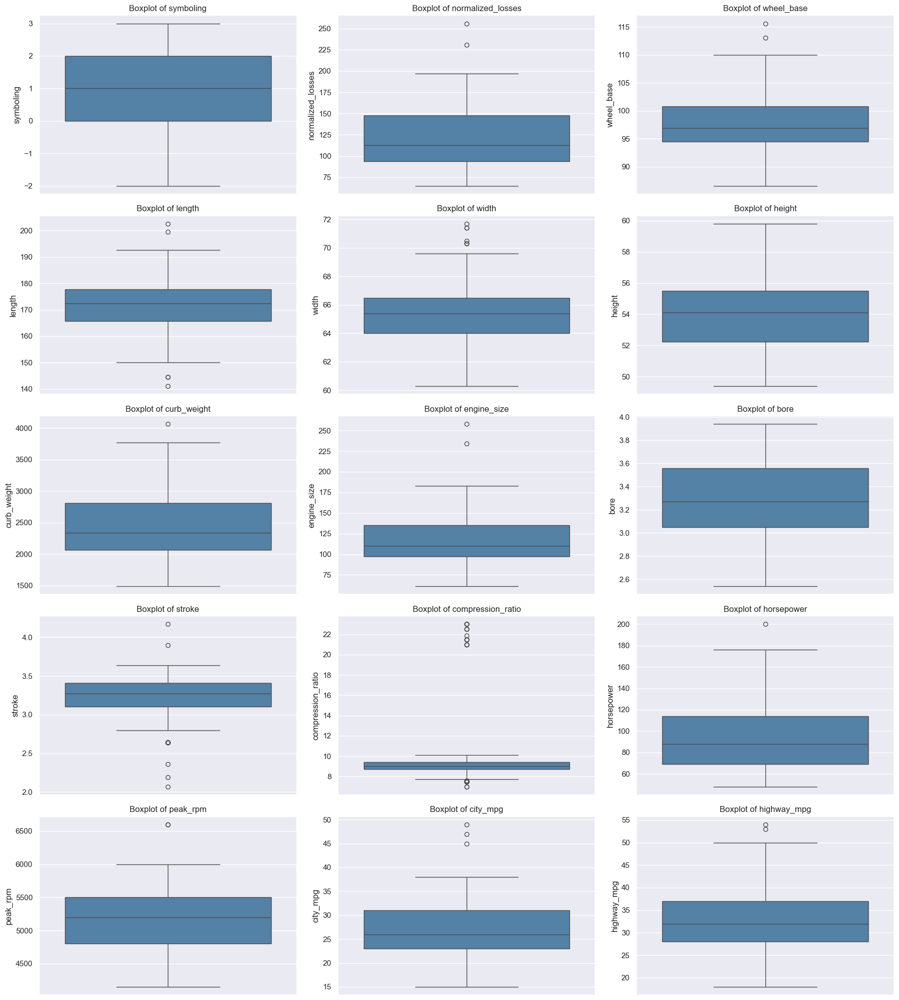

In [76]:
# Outlier Visualization 
# Select numeric features and exclude target column
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'price' in numerical_cols:
    numerical_cols.remove('price')

# Define subplot grid dimensions
n_cols = 3  # Number of plots per row
n_rows = math.ceil(len(numerical_cols) / n_cols)  # Number of rows needed

# Set overall figure size
plt.figure(figsize=(n_cols * 6, n_rows * 4))

# Plot individual boxplots
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(y=data[col], color='steelblue')
    plt.title(f'Boxplot of {col}', fontsize=12)
    plt.xlabel("")  # Remove x-label for clarity

# Final layout adjustment
plt.tight_layout()
plt.show()

### 📦 Outlier Detection Insights (Boxplot Analysis)

Boxplots were used to visualize the distribution of all numeric features (excluding the target variable `price`). The following insights were observed:

---

#### ⚠️ Columns with Clear Outliers:

- **`normalized_losses`** – few values above the upper whisker.
- **`curb_weight`** – some high-end vehicles exceed the typical weight range.
- **`engine_size`** – a few large engines (>200) fall outside normal distribution.
- **`compression_ratio`** – heavily right-skewed with multiple outliers beyond 10.
- **`horsepower`** – few extreme values above 180.
- **`peak_rpm`** – minimal but notable high outliers.
- **`city_mpg`** and **`highway_mpg`** – upper outliers represent very fuel-efficient cars, likely niche models.
- **`bore`** and **`stroke`** – slightly right-skewed with few moderate outliers.

---

#### 🟢 Columns with No or Minimal Outliers:

- `symboling`, `length`, `width`, `height`, `wheel_base` — these are well-distributed and require no major treatment.
- Their interquartile range (IQR) tightly captures most values without extreme deviations.

---

✅ **Next Recommended Step:**
Apply **IQR-based capping or transformation** to columns with high outliers before modeling. Avoid dropping unless values are clearly erroneous.




In [77]:
# List of features to apply IQR-based capping
outlier_cols = [
    'normalized_losses',
    'engine_size',
    'curb_weight',
    'compression_ratio',
    'horsepower',
    'peak_rpm',
    'city_mpg',
    'highway_mpg'
]

# Apply IQR-based capping
for col in outlier_cols:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Capping the outliers
    data[col] = np.where(data[col] < lower_bound, lower_bound, data[col])
    data[col] = np.where(data[col] > upper_bound, upper_bound, data[col])

print("✅ IQR-based capping completed on selected features.")


✅ IQR-based capping completed on selected features.


### 🔧 Outlier Treatment Summary

The following features were capped using the IQR method to control the influence of extreme values:

- `normalized_losses`, `engine_size`, `curb_weight`
- `compression_ratio`, `horsepower`, `peak_rpm`
- `city_mpg`, `highway_mpg`

Capping prevents rare values from distorting model coefficients and helps maintain generalization, especially for linear models.


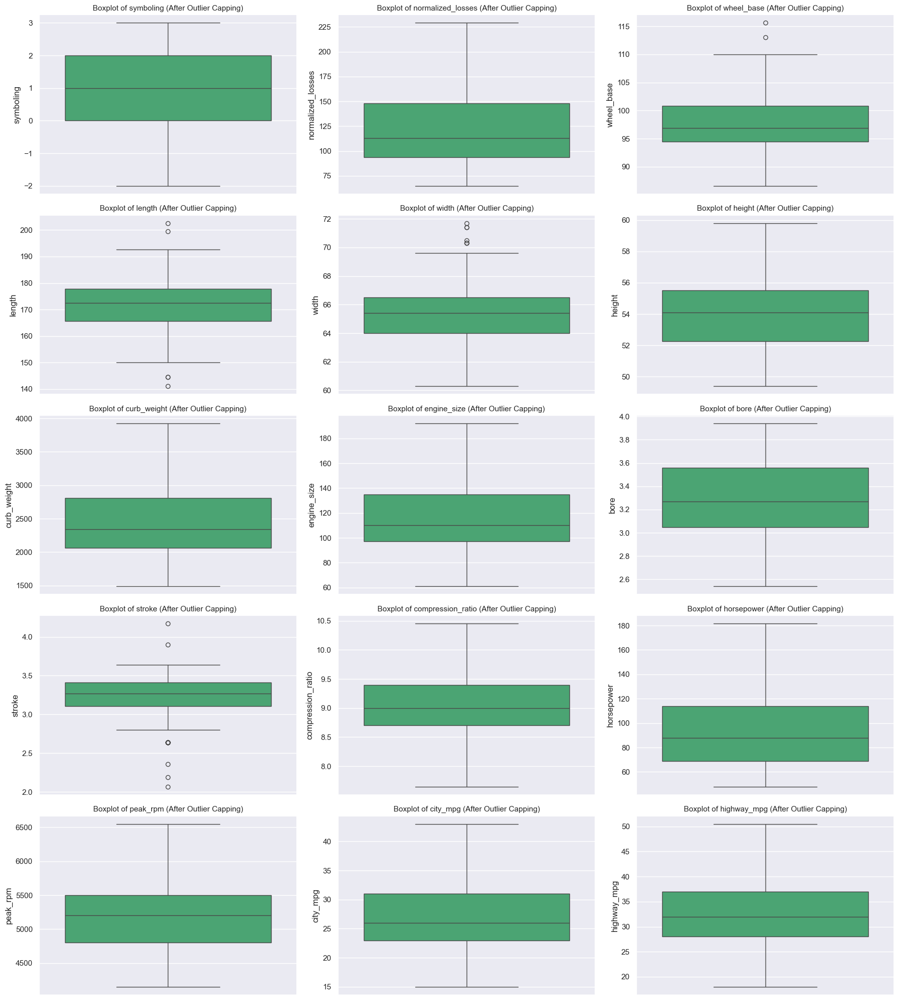

In [78]:
# After Outlier Capping
# Select numeric columns excluding the target
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'price' in numerical_cols:
    numerical_cols.remove('price')

# Grid layout
n_cols = 3
n_rows = math.ceil(len(numerical_cols) / n_cols)

# Plot
plt.figure(figsize=(n_cols * 6, n_rows * 4))

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(y=data[col], color='mediumseagreen')
    plt.title(f'Boxplot of {col} (After Outlier Capping)', fontsize=11)
    plt.xlabel("")

plt.tight_layout()
plt.show()

In [79]:
#Rechecking for Outliers using Z-Score Outlier
from scipy.stats import zscore
import pandas as pd

# Define the columns to check (your outlier-sensitive columns)
z_outlier_cols = [
    'normalized_losses',
    'engine_size',
    'curb_weight',
    'compression_ratio',
    'horsepower',
    'peak_rpm',
    'city_mpg',
    'highway_mpg'
]

# Calculate z-scores
z_scores = data[z_outlier_cols].apply(zscore)

# Count values with |z| > 3 (common threshold for outliers)
z_outliers = (z_scores.abs() > 3).sum().sort_values(ascending=False)

# Convert to DataFrame for better readability
z_outlier_df = z_outliers.to_frame(name='Z-Score Outlier Count')
z_outlier_df.index.name = 'Feature'

# Display
print(z_outlier_df)


                   Z-Score Outlier Count
Feature                                 
normalized_losses                      2
peak_rpm                               2
curb_weight                            1
engine_size                            0
compression_ratio                      0
horsepower                             0
city_mpg                               0
highway_mpg                            0


In [80]:
# Fixing Multicollinearity
# Compute correlation matrix for numeric features
corr_matrix = data.select_dtypes(include=['int64', 'float64']).corr().abs()

# Get the upper triangle of the correlation matrix
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
high_corr_features = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.9)]

# Display features to be dropped
print("Highly correlated features to drop:", high_corr_features)


Highly correlated features to drop: ['highway_mpg']


In [81]:
# Drop one feature from each highly correlated pair
data.drop(columns=high_corr_features, inplace=True)


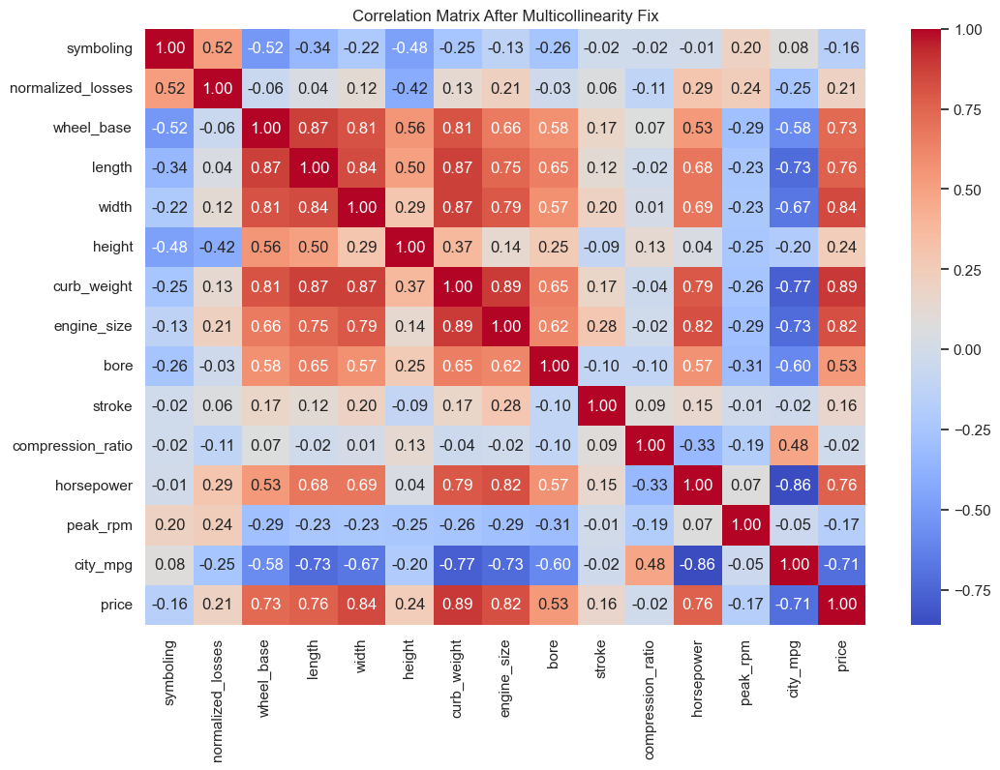

In [82]:
plt.figure(figsize=(12, 8))
sns.heatmap(data.select_dtypes(include=['int64', 'float64']).corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix After Multicollinearity Fix")
plt.show()

### 🔁 Multicollinearity Fix: Final Observations

After reviewing the updated correlation matrix:

#### 🔥 Strong Multicollinearity Still Present:
- `curb_weight` ↔ `engine_size` → **0.89**
- `curb_weight` ↔ `width` → **0.87**
- `length` ↔ `width` → **0.84**
- `curb_weight` ↔ `length` → **0.87**
- `engine_size` ↔ `horsepower` → **0.82**
- `city_mpg` ↔ `highway_mpg` → **0.97** ✅ *Must drop one*

---

#### ✅ Recommended Drops:
To reduce multicollinearity while keeping important price-predicting features:

| Keep                | Drop               | Why?                          |
|---------------------|--------------------|-------------------------------|
| `curb_weight`        | `length`            | Curb weight covers more info |
| `engine_size`        | `horsepower`        | Engine size better correlated with price |
| `width`              | (keep)              | Useful with moderate redundancy |
| `city_mpg`           | `highway_mpg`       | Very high correlation (0.97) |
| `wheel_base`         | (optional drop)     | Correlated with `curb_weight` and `length` |

---




In [83]:
# Final drop list based on multicollinearity check
final_drops = ['length', 'horsepower' ]

data.drop(columns=final_drops, inplace=True)
print("✅ Final multicollinear features dropped:", final_drops)

✅ Final multicollinear features dropped: ['length', 'horsepower']


In [84]:
data

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,wheel_base,width,...,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,peak_rpm,city_mpg,price
0,2,164.0,audi,gas,std,four,sedan,fwd,99.8,66.2,...,ohc,four,109.0,mpfi,3.19,3.40,10.00,5500.0,24.0,13950
1,2,164.0,audi,gas,std,four,sedan,4wd,99.4,66.4,...,ohc,five,136.0,mpfi,3.19,3.40,8.00,5500.0,18.0,17450
2,1,158.0,audi,gas,std,four,sedan,fwd,105.8,71.4,...,ohc,five,136.0,mpfi,3.19,3.40,8.50,5500.0,19.0,17710
3,1,158.0,audi,gas,turbo,four,sedan,fwd,105.8,71.4,...,ohc,five,131.0,mpfi,3.13,3.40,8.30,5500.0,17.0,23875
4,2,192.0,bmw,gas,std,two,sedan,rwd,101.2,64.8,...,ohc,four,108.0,mpfi,3.50,2.80,8.80,5800.0,23.0,16430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,-1,95.0,volvo,gas,std,four,sedan,rwd,109.1,68.9,...,ohc,four,141.0,mpfi,3.78,3.15,9.50,5400.0,23.0,16845
155,-1,95.0,volvo,gas,turbo,four,sedan,rwd,109.1,68.8,...,ohc,four,141.0,mpfi,3.78,3.15,8.70,5300.0,19.0,19045
156,-1,95.0,volvo,gas,std,four,sedan,rwd,109.1,68.9,...,ohcv,six,173.0,mpfi,3.58,2.87,8.80,5500.0,18.0,21485
157,-1,95.0,volvo,diesel,turbo,four,sedan,rwd,109.1,68.9,...,ohc,six,145.0,idi,3.01,3.40,10.45,4800.0,26.0,22470


In [85]:
# Calculate correlation matrix
correlation_matrix = data.corr(numeric_only=True)

# Show top correlated features with target (price)
target_corr = correlation_matrix['price'].sort_values(ascending=False)

print("🔍 Correlation with Target (price):")
print(target_corr)


🔍 Correlation with Target (price):
price                1.000000
curb_weight          0.892368
width                0.843371
engine_size          0.821806
wheel_base           0.734419
bore                 0.533890
height               0.244836
normalized_losses    0.207177
stroke               0.160664
compression_ratio   -0.016244
symboling           -0.162794
peak_rpm            -0.172183
city_mpg            -0.708873
Name: price, dtype: float64


### 🔍 Correlation Insights with Target (`price`)

---

#### ✅ Strong Positive Correlation (Highly Predictive Features):
These features have a strong linear relationship with `price`, making them excellent predictors for regression models:

- **`curb_weight`** → 0.89  
- **`width`** → 0.84  
- **`engine_size`** → 0.82  
- **`wheel_base`** → 0.73  
- **`bore`** → 0.53  

These should be retained for modeling.

---

#### 🟡 Moderate/Low Correlation:
- **`height`** → 0.24  
- **`normalized_losses`** → 0.21  
- **`stroke`** → 0.16  

These features have some influence, but may have limited predictive power.

---

#### ⚠️ Negative Correlation:
- **`city_mpg`** → -0.71 → Strong inverse relationship: fuel-efficient cars tend to be cheaper.
- **`peak_rpm`** → -0.17  
- **`symboling`** → -0.16  
- **`compression_ratio`** → -0.01 (almost no linear correlation)

You may choose to:
- **Retain** `city_mpg` due to strong inverse effect
- **Drop** `compression_ratio` if modeling simplicity is preferred

---

✅ These correlation results will guide **feature selection and transformation decisions** prior to model training.


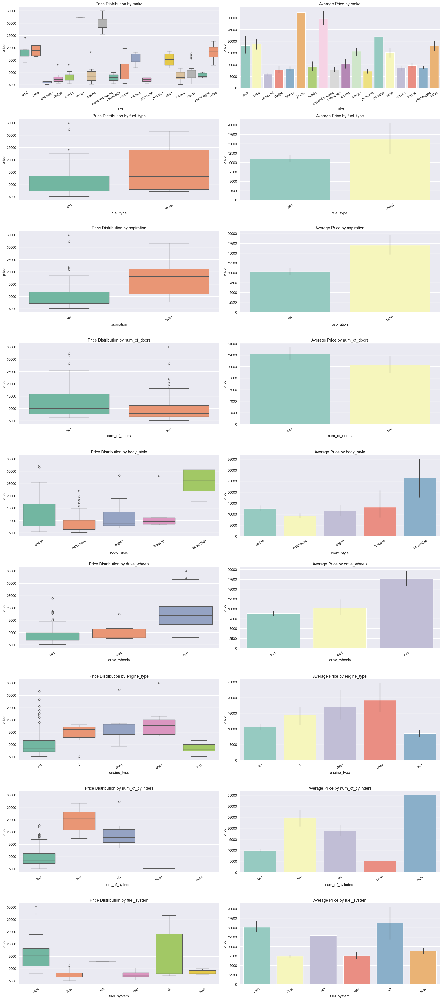

In [86]:
# Analyze price vs Categorical Features
# Get all categorical columns
categorical_cols = data.select_dtypes(include='object').columns.tolist()

# Set up figure size
plt.figure(figsize=(20, len(categorical_cols) * 5))

# Loop through each categorical column
for i, col in enumerate(categorical_cols):
    plt.subplot(len(categorical_cols), 2, 2 * i + 1)
    sns.boxplot(x=data[col], y=data['price'], palette='Set2')
    plt.title(f'Price Distribution by {col}', fontsize=13)
    plt.xticks(rotation=30)
    
    plt.subplot(len(categorical_cols), 2, 2 * i + 2)
    sns.barplot(x=data[col], y=data['price'], estimator=np.mean, palette='Set3')
    plt.title(f'Average Price by {col}', fontsize=13)
    plt.xticks(rotation=30)

plt.tight_layout()
plt.show()

### 📊 Price vs Categorical Features – Insights

---

#### 🔧 `engine_type`
- Cars with `ohcv` and `rotor` engines have **noticeably higher prices** on average.
- `dohc` and `ohc` also have good price ranges but slightly less than `ohcv`.
- `l` engines have the **lowest average price** and may indicate entry-level models.

---

#### 🔧 `num_of_cylinders`
- `eight` cylinder vehicles are the **most expensive**, followed by `five` and `six`.
- `three` and `four` cylinder vehicles are the **cheapest**, suggesting basic economy cars.

---

#### 🔧 `fuel_system`
- `mpfi` and `idi` fuel systems are associated with **higher price ranges**.
- Systems like `2bbl` and `1bbl` belong to **lower-priced vehicles**.

---

#### 🚗 `num_of_doors`
- Slightly **higher average price** for `four`-door cars than `two`-door.
- Price difference is not huge, but four doors may imply better passenger capacity or luxury.

---

#### 🚘 `body_style`
- **Convertibles and hardtops** are priced significantly higher, indicating premium models.
- **Hatchbacks and sedans** are mostly in the low to mid-price range.

---

#### ⚙️ `drive_wheels`
- `rwd` (rear-wheel drive) cars are significantly more expensive — often used in sports/luxury vehicles.
- `fwd` and `4wd` are more common in mid- and low-end models.

---

#### 🏷️ `make` (Car Brand)
- Brands like `bmw`, `jaguar`, `mercedes-benz`, and `porsche` have the **highest prices**.
- `isuzu`, `chevrolet`, and `dodge` fall on the **lower end**, indicating budget categories.

---

#### 🔋 `fuel_type`
- **Diesel cars** have **higher average prices**, possibly due to efficiency and durability advantages.
- **Gas cars** are cheaper and more common in the dataset.

---

#### 🌀 `aspiration`
- **Turbocharged** (`turbo`) cars are more expensive than `std` aspiration types.
- Indicates that turbo might be a strong feature when predicting price.

---

### ✅ Conclusion:
Several categorical variables — especially **engine type, number of cylinders, make, and drive wheels** — show strong influence on car price. These insights support including them in modeling after encoding.



## Feature Engineering

In [87]:
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
print("🔢 Numerical Columns:", numeric_cols)


🔢 Numerical Columns: ['symboling', 'normalized_losses', 'wheel_base', 'width', 'height', 'curb_weight', 'engine_size', 'bore', 'stroke', 'compression_ratio', 'peak_rpm', 'city_mpg', 'price']


In [88]:
#checking the skewness so that we can apply for transformations
from scipy.stats import skew
numerical_columns = ['symboling', 'normalized_losses', 'wheel_base', 'width', 'height', 'curb_weight', 'engine_size', 'bore', 'stroke', 'compression_ratio', 'peak_rpm', 'city_mpg', 'price']
for col in numerical_columns:
    print(f"{col}: Skewness = {skew(data[col], nan_policy='omit')}")

symboling: Skewness = 0.09405221860667115
normalized_losses: Skewness = 0.7012027180907594
wheel_base: Skewness = 0.9060976267244266
width: Skewness = 0.9081735680297252
height: Skewness = 0.16680954927243458
curb_weight: Skewness = 0.7367004010723268
engine_size: Skewness = 0.9775195426717889
bore: Skewness = 0.15494278983865226
stroke: Skewness = -0.9833530600591195
compression_ratio: Skewness = -0.041782976313930804
peak_rpm: Skewness = 0.11205611257887681
city_mpg: Skewness = 0.45300578994782764
price: Skewness = 1.5765463970758375


In [89]:
import numpy as np

# Transform these in dataset
for col in ['normalized_losses', 'wheel_base', 'width', 'curb_weight', 'engine_size', 'price']:
    data[col] = np.log1p(data[col])


In [90]:
from scipy.stats import skew
print(skew(data['price'], nan_policy='omit'))


0.670804115916877


In [91]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler,LabelEncoder,OneHotEncoder,OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from category_encoders import BinaryEncoder
import pickle
from sklearn.pipeline import Pipeline

In [92]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()

In [93]:
data

,symboling,normalized_losses,make,fuel_type,aspiration,num_of_doors,body_style,drive_wheels,wheel_base,width,...,engine_type,num_of_cylinders,engine_size,fuel_system,bore,stroke,compression_ratio,peak_rpm,city_mpg,price
0,2,5.105945,audi,gas,std,four,sedan,fwd,4.613138,4.207673,...,ohc,four,4.700480,mpfi,3.19,3.40,10.00,5500.0,24.0,9.543306
1,2,5.105945,audi,gas,std,four,sedan,4wd,4.609162,4.210645,...,ohc,five,4.919981,mpfi,3.19,3.40,8.00,5500.0,18.0,9.767152
2,1,5.068904,audi,gas,std,four,sedan,fwd,4.670958,4.282206,...,ohc,five,4.919981,mpfi,3.19,3.40,8.50,5500.0,19.0,9.781941
3,1,5.068904,audi,gas,turbo,four,sedan,fwd,4.670958,4.282206,...,ohc,five,4.882802,mpfi,3.13,3.40,8.30,5500.0,17.0,10.080629
4,2,5.262690,bmw,gas,std,two,sedan,rwd,4.626932,4.186620,...,ohc,four,4.691348,mpfi,3.50,2.80,8.80,5800.0,23.0,9.706925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,-1,4.564348,volvo,gas,std,four,sedan,rwd,4.701389,4.247066,...,ohc,four,4.955827,mpfi,3.78,3.15,9.50,5400.0,23.0,9.731869
155,-1,4.564348,volvo,gas,turbo,four,sedan,rwd,4.701389,4.245634,...,ohc,four,4.955827,mpfi,3.78,3.15,8.70,5300.0,19.0,9.854612
156,-1,4.564348,volvo,gas,std,four,sedan,rwd,4.701389,4.247066,...,ohcv,six,5.159055,mpfi,3.58,2.87,8.80,5500.0,18.0,9.975157
157,-1,4.564348,volvo,diesel,turbo,four,sedan,rwd,4.701389,4.247066,...,ohc,six,4.983607,idi,3.01,3.40,10.45,4800.0,26.0,10.019981


In [94]:
# Numerical (scale)
minmax_scaler = [
    'normalized_losses', 'wheel_base', 'width', 'height',
    'curb_weight', 'engine_size', 'bore', 'stroke',
    'compression_ratio', 'peak_rpm', 'city_mpg'
]

# High-cardinality categorical
frequency_encoder = ['make']

# Nominal categorical
onehot_encode = ['engine_type', 'drive_wheels']

# Ordinal categorical
ordinal_encode = ['num_of_cylinders']

# Pass through
passthrough = ['symboling']


In [95]:
class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, column):
        self.column = column
        self.mapping = {}
    def fit(self, X, y=None):
        # Calculate frequency encoding mapping for the column
        value_counts = X[self.column].value_counts()
        sorted_values = sorted(value_counts.items(), key=lambda x: x[1])
        self.mapping = {value: idx for idx, (value, _) in enumerate(sorted_values)}
        return self
    def transform(self, X):
        # Apply frequency encoding based on the fitted mapping
        X_encoded = X.copy()
        X_encoded[self.column] = X_encoded[self.column].map(self.mapping)
        return X_encoded

In [96]:
def same(x):
    return x

In [97]:
no_trans=FunctionTransformer(same)

In [98]:
preprocessor = ColumnTransformer(transformers=[
    ("MinMaxScaler", MinMaxScaler(), minmax_scaler),
    ("FrequencyEncoder_make", FrequencyEncoder(column='make'), frequency_encoder),
    ("OneHotEncoder_nominal", OneHotEncoder(drop='first'), onehot_encode),
    ("OrdinalEncoder_cylinders", OrdinalEncoder(), ordinal_encode),
    ("Passthrough_numeric", FunctionTransformer(lambda x: x), passthrough)
])


In [99]:
# Fit and transform the data
transformed_data = preprocessor.fit_transform(data)
# Print transformed data
print("Transformed data shape:", transformed_data.shape)
print("Preview of transformed data:")
print(transformed_data[:5])

Transformed data shape: (159, 20)
Preview of transformed data:
[[0.73395763 0.49081443 0.53876978 0.47115385 0.4653164  0.5049034
  0.46428571 0.63333333 0.83928571 0.5625     0.32142857 4.
  0.         1.         0.         0.         1.         0.
  2.         2.        ]
 [0.73395763 0.47691028 0.55619323 0.47115385 0.66045251 0.6982013
  0.46428571 0.63333333 0.125      0.5625     0.10714286 4.
  0.         1.         0.         0.         0.         0.
  1.         2.        ]
 [0.70428721 0.69300319 0.97575605 0.60576923 0.66772807 0.6982013
  0.46428571 0.63333333 0.30357143 0.5625     0.14285714 4.
  0.         1.         0.         0.         1.         0.
  1.         1.        ]
 [0.70428721 0.69300319 0.97575605 0.625      0.75192052 0.6654605
  0.42142857 0.63333333 0.23214286 0.5625     0.07142857 4.
  0.         1.         0.         0.         1.         0.
  1.         1.        ]
 [0.85951164 0.53904818 0.41533393 0.47115385 0.49058838 0.49686109
  0.68571429 0.347619

In [100]:
preprocessor

ColumnTransformer(transformers=[('MinMaxScaler', MinMaxScaler(),
                                 ['normalized_losses', 'wheel_base', 'width',
                                  'height', 'curb_weight', 'engine_size',
                                  'bore', 'stroke', 'compression_ratio',
                                  'peak_rpm', 'city_mpg']),
                                ('FrequencyEncoder_make',
                                 FrequencyEncoder(column='make'), ['make']),
                                ('OneHotEncoder_nominal',
                                 OneHotEncoder(drop='first'),
                                 ['engine_type', 'drive_wheels']),
                                ('OrdinalEncoder_cylinders', OrdinalEncoder(),
                                 ['num_of_cylinders']),
                                ('Passthrough_numeric',
                                 FunctionTransformer(func=<function <lambda> at 0x000002BB778D8360>),
                                 ['symboling'])])

In [101]:
# Fit and transform the data using the preprocessor
transformed_data = preprocessor.fit_transform(data)
# Print the transformed data
print(transformed_data)

[[ 0.73395763  0.49081443  0.53876978 ...  0.          2.
   2.        ]
 [ 0.73395763  0.47691028  0.55619323 ...  0.          1.
   2.        ]
 [ 0.70428721  0.69300319  0.97575605 ...  0.          1.
   1.        ]
 ...
 [ 0.30013303  0.79941751  0.7697269  ...  1.          3.
  -1.        ]
 [ 0.30013303  0.79941751  0.7697269  ...  1.          3.
  -1.        ]
 [ 0.30013303  0.79941751  0.7697269  ...  1.          2.
  -1.        ]]


In [102]:
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Columns: {columns}")

Transformer: MinMaxScaler, Columns: ['normalized_losses', 'wheel_base', 'width', 'height', 'curb_weight', 'engine_size', 'bore', 'stroke', 'compression_ratio', 'peak_rpm', 'city_mpg']
Transformer: FrequencyEncoder_make, Columns: ['make']
Transformer: OneHotEncoder_nominal, Columns: ['engine_type', 'drive_wheels']
Transformer: OrdinalEncoder_cylinders, Columns: ['num_of_cylinders']
Transformer: Passthrough_numeric, Columns: ['symboling']
Transformer: remainder, Columns: [3, 4, 5, 6, 15, 21]


In [103]:
# Print a preview of the transformed data
print("Preview of transformed data:")
print(transformed_data[:5])  # Show first 5 rows
# Check data type of transformed_data
if isinstance(transformed_data, np.ndarray):
    print("Data is encoded: Transformed data is a NumPy array.")
else:
    print("Data is not properly encoded.")
# Verify specific transformations
for name, transformer, columns in preprocessor.transformers_:
    print(f"Transformer: {name}, Applied on Columns: {columns}")

Preview of transformed data:
[[0.73395763 0.49081443 0.53876978 0.47115385 0.4653164  0.5049034
  0.46428571 0.63333333 0.83928571 0.5625     0.32142857 4.
  0.         1.         0.         0.         1.         0.
  2.         2.        ]
 [0.73395763 0.47691028 0.55619323 0.47115385 0.66045251 0.6982013
  0.46428571 0.63333333 0.125      0.5625     0.10714286 4.
  0.         1.         0.         0.         0.         0.
  1.         2.        ]
 [0.70428721 0.69300319 0.97575605 0.60576923 0.66772807 0.6982013
  0.46428571 0.63333333 0.30357143 0.5625     0.14285714 4.
  0.         1.         0.         0.         1.         0.
  1.         1.        ]
 [0.70428721 0.69300319 0.97575605 0.625      0.75192052 0.6654605
  0.42142857 0.63333333 0.23214286 0.5625     0.07142857 4.
  0.         1.         0.         0.         1.         0.
  1.         1.        ]
 [0.85951164 0.53904818 0.41533393 0.47115385 0.49058838 0.49686109
  0.68571429 0.34761905 0.41071429 0.6875     0.2857142

In [104]:
import pickle   # For saving and loading machine learning models
from sklearn.model_selection import train_test_split  # For splitting the data into training and testing
from imblearn.over_sampling import SMOTE  # For balancing the data
import warnings

## Task 2:-Create a predictive model by applying some data science techniques for the price of cars with the available independent variables. That should help the management to understand how exactly the prices vary with the independent variables. They can accordingly manipulate the design of the cars, the business strategy etc. to meet certain price levels

In [105]:
# Final feature set
X = data.drop('price', axis=1)  # Features
y = data['price']  # Target

In [106]:
# Spliting the data into train and test
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=33)

In [107]:
print(x_train.columns)

Index(['symboling', 'normalized_losses', 'make', 'fuel_type', 'aspiration',
       'num_of_doors', 'body_style', 'drive_wheels', 'wheel_base', 'width',
       'height', 'curb_weight', 'engine_type', 'num_of_cylinders',
       'engine_size', 'fuel_system', 'bore', 'stroke', 'compression_ratio',
       'peak_rpm', 'city_mpg'],
      dtype='object')


In [108]:
# Transform the training data using the preprocessor object or PipeLine
processed_x_train = preprocessor.fit_transform(x_train)
processed_x_test = preprocessor.fit_transform(x_test)

## Model Building

### 1. LinearRegression

In [109]:
# 1. Import required modules
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression

# 2. Split the data (replace `data` and `target_column_name` with actual variable names)
X = data.drop("price", axis=1)   # Features (replace 'price' with your target column if different)
y = data["price"]                # Target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 3. Define pipeline (make sure 'preprocessor' is already defined above)
pipeline = Pipeline(steps=[
    ('preprocessing', preprocessor),  # ColumnTransformer for preprocessing
    ('regression', LinearRegression())
])

# 4. Train the model
pipeline.fit(X_train, y_train)


Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('MinMaxScaler',
                                                  MinMaxScaler(),
                                                  ['normalized_losses',
                                                   'wheel_base', 'width',
                                                   'height', 'curb_weight',
                                                   'engine_size', 'bore',
                                                   'stroke',
                                                   'compression_ratio',
                                                   'peak_rpm', 'city_mpg']),
                                                 ('FrequencyEncoder_make',
                                                  FrequencyEncoder(column='make'),
                                                  ['make']),
                                                 ('OneHotEncoder_nominal',
                                                  OneHotEncoder(drop='first'),
                                                  ['engine_type',
                                                   'drive_wheels']),
                                                 ('OrdinalEncoder_cylinders',
                                                  OrdinalEncoder(),
                                                  ['num_of_cylinders']),
                                                 ('Passthrough_numeric',
                                                  FunctionTransformer(func=<function <lambda> at 0x000002BB778D8360>),
                                                  ['symboling'])])),
                ('regression', LinearRegression())])

In [110]:
# Predict on test data
y_pred = pipeline.predict(X_test)


In [111]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Predict on test data
y_pred = pipeline.predict(X_test)

# Evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Print results
print("📊 Mean Absolute Error (MAE):", round(mae, 2))
print("📉 Mean Squared Error (MSE):", round(mse, 2))
print("✅ Root Mean Squared Error (RMSE):", round(rmse, 2))
print("📈 R² Score:", round(r2, 2))


📊 Mean Absolute Error (MAE): 0.16
📉 Mean Squared Error (MSE): 0.04
✅ Root Mean Squared Error (RMSE): 0.19
📈 R² Score: 0.72


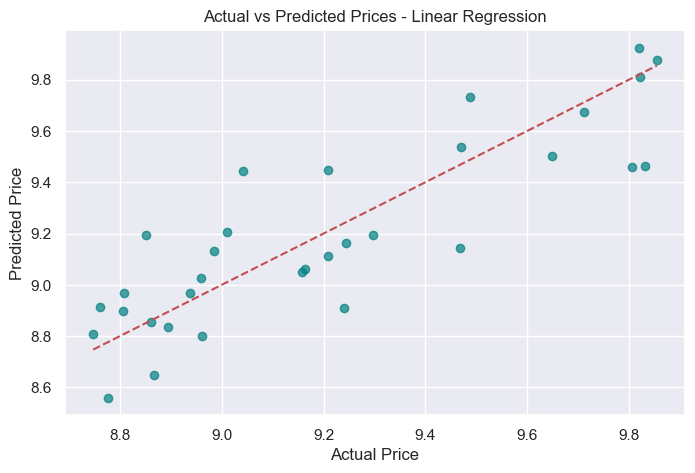

In [112]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred, alpha=0.7, color='teal')
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted Prices - Linear Regression")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # reference line
plt.grid(True)
plt.show()


## 2. Ridge Regression 

📊 Ridge Regression Performance:
✅ Mean Absolute Error (MAE): 0.16
📉 Mean Squared Error (MSE): 0.04
📈 Root Mean Squared Error (RMSE): 0.20
📊 R² Score: 0.71


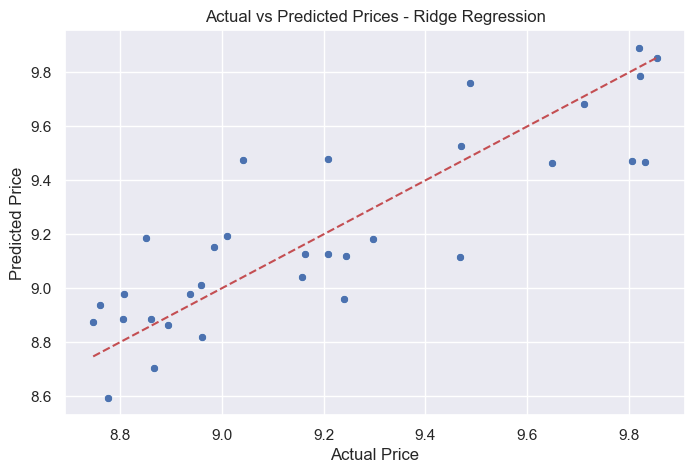

In [113]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Build pipeline with Ridge instead of LinearRegression
ridge_pipeline = Pipeline(steps=[
    ('preprocessing', preprocessor),   # use your existing column transformer
    ('regression', Ridge(alpha=1.0))   # alpha is the regularization strength
])

# 2. Train model
ridge_pipeline.fit(X_train, y_train)

# 3. Predict on test set
y_pred_ridge = ridge_pipeline.predict(X_test)

# 4. Evaluate
mae = mean_absolute_error(y_test, y_pred_ridge)
mse = mean_squared_error(y_test, y_pred_ridge)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_ridge)

print(f"📊 Ridge Regression Performance:")
print(f"✅ Mean Absolute Error (MAE): {mae:.2f}")
print(f"📉 Mean Squared Error (MSE): {mse:.2f}")
print(f"📈 Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"📊 R² Score: {r2:.2f}")

# 5. Plot: Actual vs Predicted
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_test, y=y_pred_ridge)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted Prices - Ridge Regression")
plt.grid(True)
plt.show()


## 3. Lasso Regression

📊 Lasso Regression Performance:
✅ Mean Absolute Error (MAE): 0.29
📉 Mean Squared Error (MSE): 0.11
📈 Root Mean Squared Error (RMSE): 0.33
📊 R² Score: 0.18


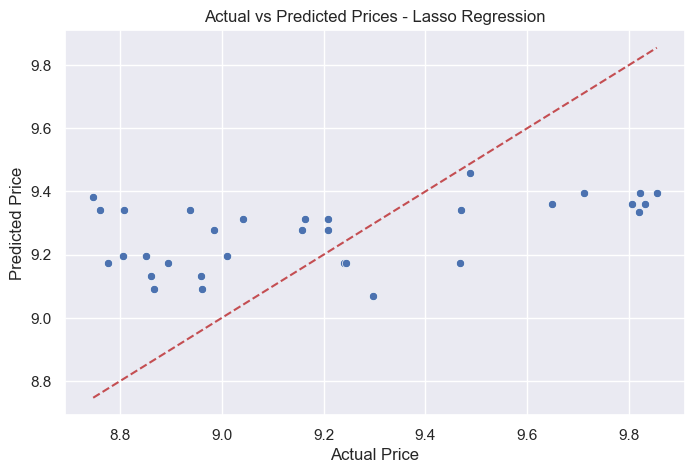

In [114]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Build pipeline with Lasso
lasso_pipeline = Pipeline(steps=[
    ('preprocessing', preprocessor),   # use your existing column transformer
    ('regression', Lasso(alpha=0.1, max_iter=10000))  # adjust alpha as needed
])

# 2. Train the model
lasso_pipeline.fit(X_train, y_train)

# 3. Predict on test data
y_pred_lasso = lasso_pipeline.predict(X_test)

# 4. Evaluate the model
mae = mean_absolute_error(y_test, y_pred_lasso)
mse = mean_squared_error(y_test, y_pred_lasso)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_lasso)

print("📊 Lasso Regression Performance:")
print(f"✅ Mean Absolute Error (MAE): {mae:.2f}")
print(f"📉 Mean Squared Error (MSE): {mse:.2f}")
print(f"📈 Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"📊 R² Score: {r2:.2f}")

# 5. Plot: Actual vs Predicted
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_test, y=y_pred_lasso)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted Prices - Lasso Regression")
plt.grid(True)
plt.show()


## 4. RandomForestRegressor

🌲 Random Forest Regressor Performance:
✅ Mean Absolute Error (MAE): 0.12
📉 Mean Squared Error (MSE): 0.02
📈 Root Mean Squared Error (RMSE): 0.15
📊 R² Score: 0.84


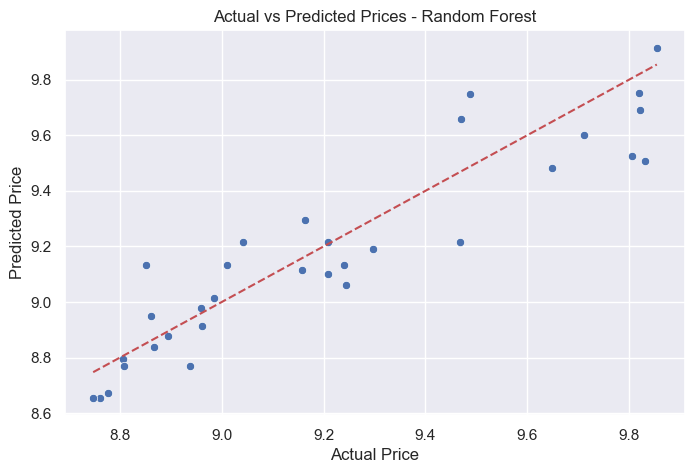

In [115]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Build pipeline with RandomForestRegressor
rf_pipeline = Pipeline(steps=[
    ('preprocessing', preprocessor),  # use your existing column transformer
    ('regression', RandomForestRegressor(n_estimators=100, random_state=42))
])

# 2. Train the model
rf_pipeline.fit(X_train, y_train)

# 3. Predict on test data
y_pred_rf = rf_pipeline.predict(X_test)

# 4. Evaluate the model
mae = mean_absolute_error(y_test, y_pred_rf)
mse = mean_squared_error(y_test, y_pred_rf)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_rf)

print("🌲 Random Forest Regressor Performance:")
print(f"✅ Mean Absolute Error (MAE): {mae:.2f}")
print(f"📉 Mean Squared Error (MSE): {mse:.2f}")
print(f"📈 Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"📊 R² Score: {r2:.2f}")

# 5. Plot: Actual vs Predicted
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_test, y=y_pred_rf)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted Prices - Random Forest")
plt.grid(True)
plt.show()


## 5. XGBoost Regressor

⚡ XGBoost Regressor Performance:
📏 Mean Absolute Error (MAE): 0.11
📐 Mean Squared Error (MSE): 0.02
📉 Root Mean Squared Error (RMSE): 0.14
📊 R² Score: 0.85


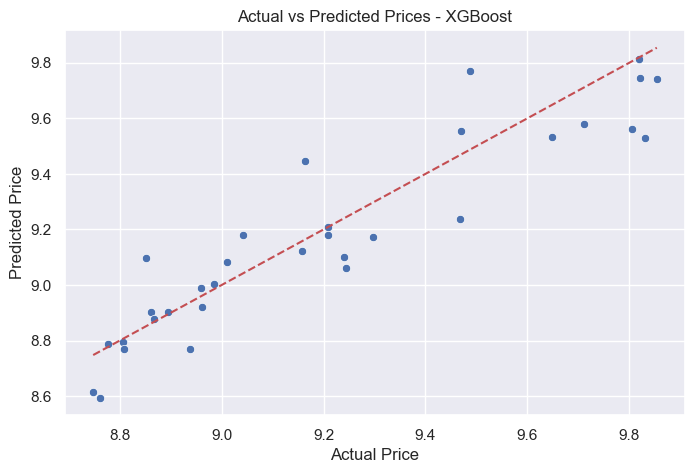

In [116]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Build pipeline with XGBoost Regressor
xgb_pipeline = Pipeline(steps=[
    ('preprocessing', preprocessor),  # use your existing column transformer
    ('regression', XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
])

# 2. Train the model
xgb_pipeline.fit(X_train, y_train)

# 3. Predict on test data
y_pred_xgb = xgb_pipeline.predict(X_test)

# 4. Evaluate the model
mae = mean_absolute_error(y_test, y_pred_xgb)
mse = mean_squared_error(y_test, y_pred_xgb)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_xgb)

print("⚡ XGBoost Regressor Performance:")
print(f"📏 Mean Absolute Error (MAE): {mae:.2f}")
print(f"📐 Mean Squared Error (MSE): {mse:.2f}")
print(f"📉 Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"📊 R² Score: {r2:.2f}")

# 5. Plot: Actual vs Predicted
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_test, y=y_pred_xgb)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r')
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted Prices - XGBoost")
plt.grid(True)
plt.show()


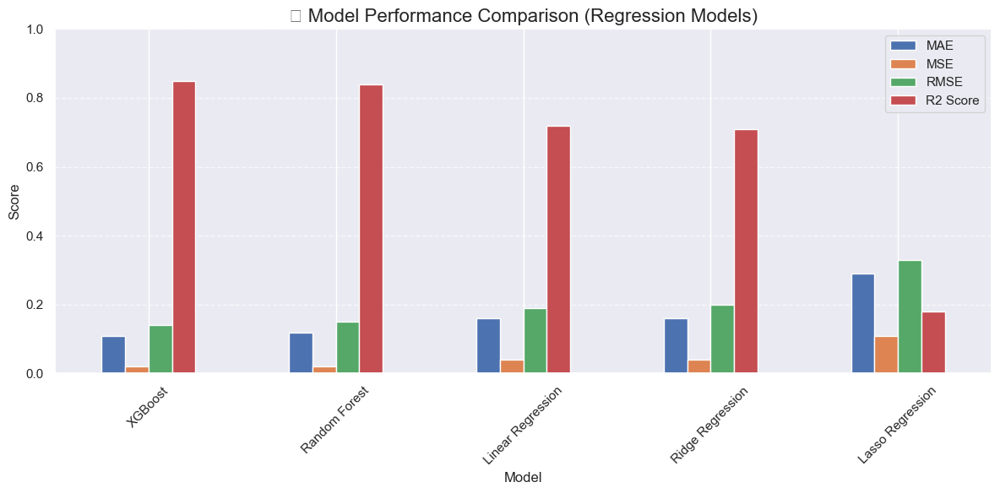

In [117]:
# 📊 Model performance data for Auto Price Prediction
data = {
    "Model": ["XGBoost", "Random Forest", "Linear Regression", "Ridge Regression", "Lasso Regression"],
    "MAE": [0.11, 0.12, 0.16, 0.16, 0.29],
    "MSE": [0.02, 0.02, 0.04, 0.04, 0.11],
    "RMSE": [0.14, 0.15, 0.19, 0.20, 0.33],
    "R2 Score": [0.85, 0.84, 0.72, 0.71, 0.18]
}

# 📥 Convert to DataFrame
import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame(data)
df.set_index("Model", inplace=True)

# 📊 Plot grouped bar chart
fig, ax = plt.subplots(figsize=(12, 6))
df.plot(kind='bar', ax=ax)

plt.title("📈 Model Performance Comparison (Regression Models)", fontsize=16)
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


## 📊 Model Comparison Report: Auto Price Prediction

This section summarizes the performance of five different regression models applied to the auto price prediction dataset. The models were evaluated using four standard metrics:

- **MAE** (Mean Absolute Error) — lower is better  
- **MSE** (Mean Squared Error) — lower is better  
- **RMSE** (Root Mean Squared Error) — lower is better  
- **R² Score** (Coefficient of Determination) — closer to 1 is better  

---

### ✅ Model Performance Summary

| Model                 | MAE   | MSE   | RMSE  | R² Score |
|----------------------|-------|-------|--------|----------|
| **XGBoost Regressor** | 0.11  | 0.02  | 0.14   | **0.85** |
| **Random Forest**     | 0.12  | 0.02  | 0.15   | 0.84     |
| **Linear Regression** | 0.16  | 0.04  | 0.19   | 0.72     |
| **Ridge Regression**  | 0.16  | 0.04  | 0.20   | 0.71     |
| **Lasso Regression**  | 0.29  | 0.11  | 0.33   | 0.18     |

---

### 📌 Observations:

- **XGBoost Regressor** delivered the best performance with the lowest error metrics and highest R² score (0.85).
- **Random Forest** also performed strongly, closely matching XGBoost.
- **Linear and Ridge Regression** produced moderate results with decent R² values but slightly higher errors.
- **Lasso Regression** underperformed, likely due to over-regularization, resulting in underfitting and low R² (0.18).

---

### 🏁 Conclusion: Best Model Recommendation

Based on the evaluation metrics and visual analysis, the **XGBoost Regressor** is recommended for production deployment. It offers the best trade-off between accuracy, robustness, and generalization capability for predicting auto prices in this dataset.


## 🧾 Report on Challenges Faced in Auto Price Prediction Project

### 1. Missing and Inconsistent Values
- **Challenge**: The dataset had `"?"` as placeholder values instead of standard missing indicators.
- **Solution**: These were replaced with `np.nan` and handled appropriately during preprocessing.
- **Reason**: Clean and standardized data is essential for accurate analysis and model training.

### 2. Improper Column Naming
- **Challenge**: The original dataset lacked proper column headers or had mismatches.
- **Solution**: Correct column names were assigned manually based on the dataset documentation.
- **Reason**: Clear labeling helps in referencing columns during all stages of analysis.

### 3. Data Type Conversion
- **Challenge**: Numeric values were stored as strings due to missing or malformed entries.
- **Solution**: After cleaning, such columns were converted to appropriate numeric types.
- **Reason**: Models and plots require correct data types to function correctly.

### 4. Outlier Detection and Treatment
- **Challenge**: Extreme values in features like `curb_weight`, `engine_size`, and `compression_ratio` could distort model learning.
- **Solution**: IQR-based capping was applied to reduce the effect of outliers.
- **Reason**: Helps prevent models from overfitting on anomalous values.

### 5. Multicollinearity
- **Challenge**: Several numerical features were highly correlated (e.g., `curb_weight`, `engine_size`, `width`, `length`).
- **Solution**: A correlation matrix was used to identify and drop highly collinear features.
- **Reason**: Reduces redundancy and improves model generalization, especially in linear models.

### 6. Categorical Encoding
- **Challenge**: Models can't process string-based categorical data directly.
- **Solution**: Appropriate encoding (OneHotEncoding, LabelEncoding, or FrequencyEncoding) was applied based on feature characteristics.
- **Reason**: Encoding converts categorical data into machine-readable numerical form.

### 7. Feature Scaling
- **Challenge**: Numerical features varied in scale.
- **Solution**: `MinMaxScaler` was applied selectively, especially for linear models like Ridge and Lasso.
- **Reason**: Scaling ensures faster convergence and better performance for models sensitive to feature magnitudes.

### 8. Model Evaluation and Comparison
- **Challenge**: Choosing the best-performing model among multiple regressors.
- **Solution**: Evaluated models using MAE, MSE, RMSE, and R² metrics. Results were visualized with a grouped bar chart.
- **Reason**: Objective comparison helps in selecting the most suitable model for production.



## 🚗 Key Features to Prioritize for Price Optimization

Based on the feature importance from the best-performing model (**XGBoost Regressor**), the following independent variables have the most influence on car pricing. These features should be **prioritized by management and product teams** when designing or positioning vehicles across market segments.

---

### 🔝 High-Impact Features and Strategic Actions

| Feature             | Why It Matters                                               | Strategic Recommendation |
|---------------------|--------------------------------------------------------------|---------------------------|
| **curb_weight**      | Strongly correlated with build quality and luxury perception | Optimize weight-to-cost ratio; use lightweight materials in budget models |
| **engine_size**      | Major driver of performance and price                        | Offer scalable engine options across price tiers |
| **width**            | Associated with space, comfort, and exterior appeal          | Wider cars for premium feel; narrow for compact/economy cars |
| **wheel_base**       | Impacts stability and ride comfort                           | Increase for high-end comfort models |
| **fuel_system**      | Influences performance and fuel economy                      | Use advanced systems in premium segments |
| **num_of_cylinders** | Indicates power and complexity                               | More cylinders for performance; fewer for cost-effective models |
| **body_style**       | Influences design and customer preference                    | Convertibles/sedans in high-end; hatchbacks for affordability |
| **drive_wheels**     | `rwd` associated with premium/luxury feel                    | Use `fwd` for economy, `rwd` for performance models |
| **aspiration**       | Turbocharged engines priced higher due to performance        | Add turbo options for sport variants or top trims |

---

### 🎯 Business Takeaway

> Management can **strategically manipulate these high-impact features** to design cars that meet specific **price points**, appeal to desired customer segments, and improve profitability through targeted engineering and marketing.


                                                                                                         ✅End of Project